<a href="https://colab.research.google.com/github/singhjyoti1997/Deep-Learning/blob/main/cityscapes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install opendatasets

In [2]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/dinararzayeva/city-dataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jyoti19971111
Your Kaggle Key: ··········


100%|██████████| 118M/118M [00:01<00:00, 89.9MB/s]


In [3]:
import os

DATA_DIR = '/content/cityscapes'
print(os.listdir(DATA_DIR))

['img']


In [4]:
print(os.listdir(DATA_DIR+'/img')[:10])

['1009_photo.jpg', '1744_photo.jpg', '193_photo.jpg', '1162_photo.jpg', '1246_photo.jpg', '1479_photo.jpg', '1519_photo.jpg', '808_photo.jpg', '175_photo.jpg', '184_photo.jpg']


In [5]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [6]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [8]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [10]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

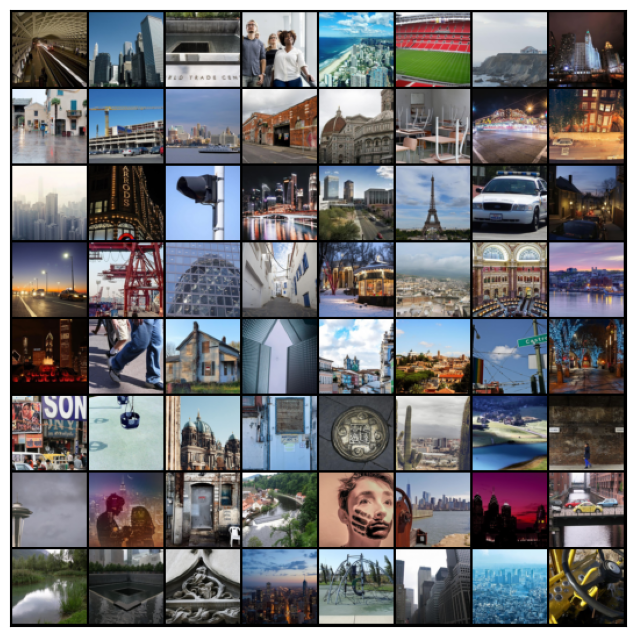

In [11]:
show_batch(train_dl)

In [12]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [13]:
device = get_default_device()
device

device(type='cuda')

In [14]:
train_dl = DeviceDataLoader(train_dl, device)

In [15]:
import torch.nn as nn

In [16]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [17]:
discriminator = to_device(discriminator, device)

In [18]:
latent_size = 128

In [19]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


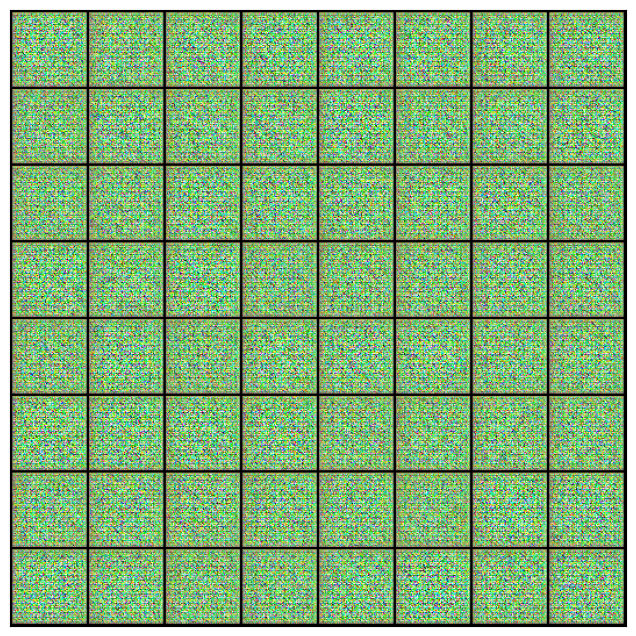

In [20]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [21]:
generator = to_device(generator, device)

In [22]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [23]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [24]:
from torchvision.utils import save_image

In [25]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [26]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [27]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


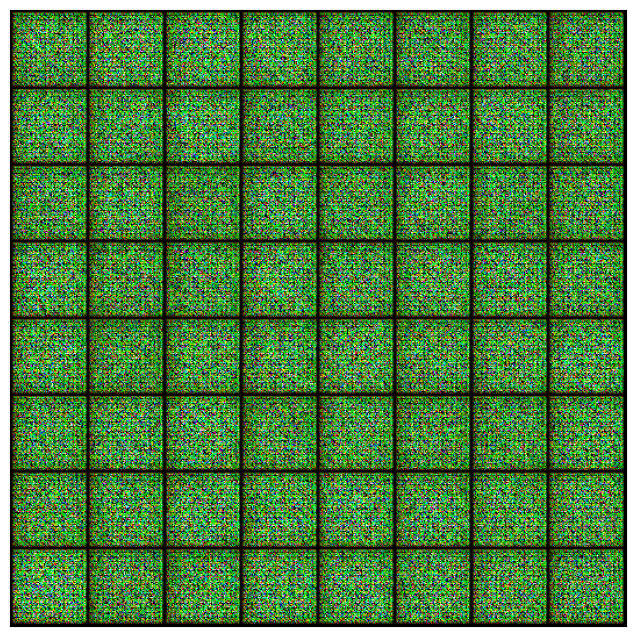

In [28]:
save_samples(0, fixed_latent)

In [29]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [30]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [31]:
lr = 0.0002
epochs = 500

In [32]:
history = fit(epochs, lr)

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 8.1209, loss_d: 0.5040, real_score: 0.9082, fake_score: 0.3259
Saving generated-images-0001.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 11.0723, loss_d: 0.6817, real_score: 0.6509, fake_score: 0.0000
Saving generated-images-0002.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 10.0282, loss_d: 1.2680, real_score: 0.6144, fake_score: 0.4047
Saving generated-images-0003.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 5.4526, loss_d: 0.0198, real_score: 0.9920, fake_score: 0.0116
Saving generated-images-0004.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 4.0277, loss_d: 0.7716, real_score: 0.5772, fake_score: 0.0957
Saving generated-images-0005.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 4.9317, loss_d: 0.5465, real_score: 0.8091, fake_score: 0.2522
Saving generated-images-0006.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 1.8460, loss_d: 1.1644, real_score: 0.5362, fake_score: 0.3294
Saving generated-images-0007.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 2.1498, loss_d: 0.2155, real_score: 0.9363, fake_score: 0.1357
Saving generated-images-0008.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 2.9790, loss_d: 0.6976, real_score: 0.7118, fake_score: 0.2589
Saving generated-images-0009.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 0.8345, loss_d: 0.9372, real_score: 0.4951, fake_score: 0.0908
Saving generated-images-0010.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 3.3702, loss_d: 1.1016, real_score: 0.7112, fake_score: 0.4807
Saving generated-images-0011.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 5.5484, loss_d: 2.3156, real_score: 0.9851, fake_score: 0.8548
Saving generated-images-0012.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 1.0216, loss_d: 0.9672, real_score: 0.4541, fake_score: 0.0468
Saving generated-images-0013.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 3.2176, loss_d: 0.5251, real_score: 0.7669, fake_score: 0.1894
Saving generated-images-0014.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 4.6643, loss_d: 0.7194, real_score: 0.8853, fake_score: 0.4147
Saving generated-images-0015.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 2.6739, loss_d: 0.5255, real_score: 0.8297, fake_score: 0.2562
Saving generated-images-0016.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 2.7845, loss_d: 0.6885, real_score: 0.7544, fake_score: 0.2943
Saving generated-images-0017.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 2.8023, loss_d: 0.9881, real_score: 0.8905, fake_score: 0.4238
Saving generated-images-0018.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 2.6871, loss_d: 0.4303, real_score: 0.7670, fake_score: 0.1409
Saving generated-images-0019.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 2.5516, loss_d: 0.8261, real_score: 0.5243, fake_score: 0.0591
Saving generated-images-0020.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 0.6231, loss_d: 2.4460, real_score: 0.1157, fake_score: 0.0243
Saving generated-images-0021.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 0.5406, loss_d: 1.4986, real_score: 0.3489, fake_score: 0.1679
Saving generated-images-0022.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 2.4237, loss_d: 0.9017, real_score: 0.6740, fake_score: 0.3388
Saving generated-images-0023.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 3.0730, loss_d: 0.5544, real_score: 0.7617, fake_score: 0.2196
Saving generated-images-0024.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 0.2585, loss_d: 1.0436, real_score: 0.4896, fake_score: 0.1932
Saving generated-images-0025.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 0.4823, loss_d: 1.5682, real_score: 0.2705, fake_score: 0.1909
Saving generated-images-0026.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 2.6222, loss_d: 0.8195, real_score: 0.6152, fake_score: 0.2285
Saving generated-images-0027.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 0.6421, loss_d: 1.2139, real_score: 0.4117, fake_score: 0.1428
Saving generated-images-0028.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 3.3418, loss_d: 1.3782, real_score: 0.9180, fake_score: 0.6764
Saving generated-images-0029.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 0.3304, loss_d: 2.1915, real_score: 0.2074, fake_score: 0.2353
Saving generated-images-0030.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 2.3111, loss_d: 2.4211, real_score: 0.1611, fake_score: 0.0119
Saving generated-images-0031.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 1.5588, loss_d: 0.6897, real_score: 0.5647, fake_score: 0.1005
Saving generated-images-0032.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 3.0578, loss_d: 0.3452, real_score: 0.8184, fake_score: 0.1213
Saving generated-images-0033.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 0.7197, loss_d: 1.8282, real_score: 0.2669, fake_score: 0.2649
Saving generated-images-0034.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 2.4470, loss_d: 0.4500, real_score: 0.7110, fake_score: 0.0839
Saving generated-images-0035.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 1.3022, loss_d: 0.7847, real_score: 0.6250, fake_score: 0.2395
Saving generated-images-0036.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 5.6912, loss_d: 0.9335, real_score: 0.9126, fake_score: 0.5344
Saving generated-images-0037.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 2.9340, loss_d: 0.6267, real_score: 0.6785, fake_score: 0.1533
Saving generated-images-0038.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 1.4299, loss_d: 0.8105, real_score: 0.5573, fake_score: 0.1369
Saving generated-images-0039.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 5.6574, loss_d: 0.8682, real_score: 0.8784, fake_score: 0.4835
Saving generated-images-0040.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 0.3591, loss_d: 1.3876, real_score: 0.3263, fake_score: 0.0940
Saving generated-images-0041.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 2.8493, loss_d: 0.5203, real_score: 0.8454, fake_score: 0.2770
Saving generated-images-0042.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 4.4359, loss_d: 0.5902, real_score: 0.9154, fake_score: 0.3574
Saving generated-images-0043.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 0.6853, loss_d: 0.9064, real_score: 0.5287, fake_score: 0.1195
Saving generated-images-0044.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 0.2011, loss_d: 2.2975, real_score: 0.1525, fake_score: 0.0924
Saving generated-images-0045.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 4.2095, loss_d: 0.3231, real_score: 0.8590, fake_score: 0.1472
Saving generated-images-0046.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 1.1607, loss_d: 0.8186, real_score: 0.5547, fake_score: 0.0828
Saving generated-images-0047.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 0.8210, loss_d: 1.8657, real_score: 0.2651, fake_score: 0.2009
Saving generated-images-0048.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 2.8239, loss_d: 0.3394, real_score: 0.8700, fake_score: 0.1717
Saving generated-images-0049.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 2.4926, loss_d: 0.7212, real_score: 0.7075, fake_score: 0.2607
Saving generated-images-0050.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 0.1545, loss_d: 2.6322, real_score: 0.1521, fake_score: 0.2818
Saving generated-images-0051.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 2.8764, loss_d: 0.7536, real_score: 0.5673, fake_score: 0.1293
Saving generated-images-0052.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 3.0132, loss_d: 0.6450, real_score: 0.6039, fake_score: 0.0483
Saving generated-images-0053.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 2.2922, loss_d: 1.1041, real_score: 0.5500, fake_score: 0.2426
Saving generated-images-0054.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 1.3596, loss_d: 0.9122, real_score: 0.5525, fake_score: 0.2376
Saving generated-images-0055.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 3.1796, loss_d: 0.4619, real_score: 0.9228, fake_score: 0.2938
Saving generated-images-0056.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 0.3191, loss_d: 1.2313, real_score: 0.3775, fake_score: 0.1112
Saving generated-images-0057.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 2.7264, loss_d: 0.7533, real_score: 0.6957, fake_score: 0.2455
Saving generated-images-0058.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 4.9574, loss_d: 0.1775, real_score: 0.9031, fake_score: 0.0701
Saving generated-images-0059.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 0.3908, loss_d: 2.4817, real_score: 0.1723, fake_score: 0.2901
Saving generated-images-0060.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 5.0303, loss_d: 0.5578, real_score: 0.9342, fake_score: 0.3551
Saving generated-images-0061.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 1.4210, loss_d: 1.1692, real_score: 0.4161, fake_score: 0.1735
Saving generated-images-0062.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 4.5617, loss_d: 0.7646, real_score: 0.9236, fake_score: 0.4524
Saving generated-images-0063.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 1.1978, loss_d: 1.2074, real_score: 0.4407, fake_score: 0.2434
Saving generated-images-0064.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 3.2870, loss_d: 0.7799, real_score: 0.6796, fake_score: 0.2891
Saving generated-images-0065.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 0.7404, loss_d: 1.0946, real_score: 0.4158, fake_score: 0.0876
Saving generated-images-0066.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 3.1967, loss_d: 0.4808, real_score: 0.7524, fake_score: 0.1564
Saving generated-images-0067.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 2.3161, loss_d: 0.6460, real_score: 0.7129, fake_score: 0.1844
Saving generated-images-0068.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 2.0290, loss_d: 0.5883, real_score: 0.6539, fake_score: 0.1242
Saving generated-images-0069.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 2.5644, loss_d: 0.6689, real_score: 0.7559, fake_score: 0.2621
Saving generated-images-0070.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 4.2652, loss_d: 0.5058, real_score: 0.8873, fake_score: 0.2825
Saving generated-images-0071.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 1.5057, loss_d: 0.8365, real_score: 0.5089, fake_score: 0.0811
Saving generated-images-0072.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 4.8339, loss_d: 0.3652, real_score: 0.9450, fake_score: 0.2528
Saving generated-images-0073.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 0.1835, loss_d: 2.7655, real_score: 0.0988, fake_score: 0.2374
Saving generated-images-0074.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 0.6019, loss_d: 1.4100, real_score: 0.4192, fake_score: 0.3074
Saving generated-images-0075.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 3.8608, loss_d: 0.3926, real_score: 0.9104, fake_score: 0.2399
Saving generated-images-0076.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 2.0627, loss_d: 0.5982, real_score: 0.7277, fake_score: 0.2034
Saving generated-images-0077.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 2.3918, loss_d: 0.7704, real_score: 0.6752, fake_score: 0.2705
Saving generated-images-0078.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 0.7765, loss_d: 0.6364, real_score: 0.6473, fake_score: 0.1223
Saving generated-images-0079.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 2.1975, loss_d: 0.8059, real_score: 0.5544, fake_score: 0.0802
Saving generated-images-0080.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 1.2929, loss_d: 2.1633, real_score: 0.1241, fake_score: 0.0093
Saving generated-images-0081.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 0.2405, loss_d: 1.4078, real_score: 0.3783, fake_score: 0.2323
Saving generated-images-0082.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 2.7039, loss_d: 0.5351, real_score: 0.7839, fake_score: 0.2327
Saving generated-images-0083.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 2.9405, loss_d: 0.4545, real_score: 0.7901, fake_score: 0.1741
Saving generated-images-0084.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 1.1250, loss_d: 1.1577, real_score: 0.4003, fake_score: 0.1430
Saving generated-images-0085.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 0.3027, loss_d: 1.3403, real_score: 0.3817, fake_score: 0.1523
Saving generated-images-0086.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 3.7109, loss_d: 0.4735, real_score: 0.9017, fake_score: 0.2901
Saving generated-images-0087.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 2.4092, loss_d: 0.4947, real_score: 0.6753, fake_score: 0.0791
Saving generated-images-0088.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 0.6135, loss_d: 1.2773, real_score: 0.4071, fake_score: 0.1774
Saving generated-images-0089.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 0.4923, loss_d: 1.2900, real_score: 0.3638, fake_score: 0.2086
Saving generated-images-0090.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 3.7457, loss_d: 0.7406, real_score: 0.7541, fake_score: 0.3184
Saving generated-images-0091.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 3.1706, loss_d: 0.4990, real_score: 0.8574, fake_score: 0.2613
Saving generated-images-0092.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 1.2300, loss_d: 0.7705, real_score: 0.5798, fake_score: 0.1333
Saving generated-images-0093.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 3.2014, loss_d: 1.1174, real_score: 0.5711, fake_score: 0.3695
Saving generated-images-0094.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 1.0247, loss_d: 0.8211, real_score: 0.4926, fake_score: 0.0580
Saving generated-images-0095.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 3.0430, loss_d: 0.6170, real_score: 0.6562, fake_score: 0.0641
Saving generated-images-0096.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 5.1240, loss_d: 0.3204, real_score: 0.9450, fake_score: 0.2226
Saving generated-images-0097.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 5.4070, loss_d: 0.2760, real_score: 0.9544, fake_score: 0.1930
Saving generated-images-0098.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 4.4538, loss_d: 0.6629, real_score: 0.8211, fake_score: 0.3339
Saving generated-images-0099.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 3.8246, loss_d: 1.2860, real_score: 0.5882, fake_score: 0.4557
Saving generated-images-0100.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 2.5025, loss_d: 0.5875, real_score: 0.7168, fake_score: 0.1651
Saving generated-images-0101.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 2.7265, loss_d: 0.3906, real_score: 0.7421, fake_score: 0.0661
Saving generated-images-0102.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 1.7891, loss_d: 0.9548, real_score: 0.6105, fake_score: 0.2299
Saving generated-images-0103.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 2.2834, loss_d: 0.5441, real_score: 0.7377, fake_score: 0.1809
Saving generated-images-0104.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 5.1393, loss_d: 0.1505, real_score: 0.9735, fake_score: 0.1081
Saving generated-images-0105.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 1.3926, loss_d: 0.8847, real_score: 0.5365, fake_score: 0.1962
Saving generated-images-0106.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 0.8632, loss_d: 0.8942, real_score: 0.4813, fake_score: 0.0787
Saving generated-images-0107.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 4.0994, loss_d: 0.2738, real_score: 0.8577, fake_score: 0.0857
Saving generated-images-0108.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 1.2303, loss_d: 0.6884, real_score: 0.6226, fake_score: 0.1734
Saving generated-images-0109.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 3.1999, loss_d: 0.4970, real_score: 0.6405, fake_score: 0.0202
Saving generated-images-0110.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 3.1704, loss_d: 0.3491, real_score: 0.8164, fake_score: 0.1285
Saving generated-images-0111.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 1.6799, loss_d: 0.7206, real_score: 0.5913, fake_score: 0.0949
Saving generated-images-0112.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 3.8440, loss_d: 0.3066, real_score: 0.9299, fake_score: 0.1928
Saving generated-images-0113.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 0.9134, loss_d: 0.8901, real_score: 0.4543, fake_score: 0.0257
Saving generated-images-0114.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 5.1590, loss_d: 0.5691, real_score: 0.9216, fake_score: 0.3439
Saving generated-images-0115.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 3.8129, loss_d: 0.2991, real_score: 0.8260, fake_score: 0.0893
Saving generated-images-0116.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 0.9967, loss_d: 1.0092, real_score: 0.4689, fake_score: 0.1088
Saving generated-images-0117.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 3.8699, loss_d: 0.2866, real_score: 0.8871, fake_score: 0.1371
Saving generated-images-0118.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 4.8120, loss_d: 0.3933, real_score: 0.9685, fake_score: 0.2778
Saving generated-images-0119.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 6.9865, loss_d: 1.1675, real_score: 0.9315, fake_score: 0.6273
Saving generated-images-0120.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 1.3810, loss_d: 0.8537, real_score: 0.5499, fake_score: 0.1523
Saving generated-images-0121.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 0.2714, loss_d: 1.2546, real_score: 0.3718, fake_score: 0.0733
Saving generated-images-0122.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 0.0404, loss_d: 3.1135, real_score: 0.0796, fake_score: 0.1195
Saving generated-images-0123.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 1.9891, loss_d: 1.3154, real_score: 0.3200, fake_score: 0.0417
Saving generated-images-0124.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 2.8439, loss_d: 0.4224, real_score: 0.8348, fake_score: 0.1866
Saving generated-images-0125.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 1.5896, loss_d: 0.7216, real_score: 0.5481, fake_score: 0.0666
Saving generated-images-0126.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 5.5492, loss_d: 0.2327, real_score: 0.8442, fake_score: 0.0413
Saving generated-images-0127.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 0.1177, loss_d: 1.8983, real_score: 0.1952, fake_score: 0.0824
Saving generated-images-0128.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 3.5568, loss_d: 0.3290, real_score: 0.8081, fake_score: 0.0858
Saving generated-images-0129.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 3.0116, loss_d: 0.4786, real_score: 0.7894, fake_score: 0.1963
Saving generated-images-0130.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 1.1460, loss_d: 1.2238, real_score: 0.3883, fake_score: 0.0269
Saving generated-images-0131.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 0.6118, loss_d: 1.3183, real_score: 0.3150, fake_score: 0.0353
Saving generated-images-0132.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 2.6913, loss_d: 0.5264, real_score: 0.7742, fake_score: 0.1949
Saving generated-images-0133.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 2.2702, loss_d: 0.4981, real_score: 0.7463, fake_score: 0.1526
Saving generated-images-0134.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 0.8543, loss_d: 1.0438, real_score: 0.4381, fake_score: 0.1327
Saving generated-images-0135.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 4.5285, loss_d: 0.3265, real_score: 0.9219, fake_score: 0.1982
Saving generated-images-0136.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 4.1133, loss_d: 0.4233, real_score: 0.9000, fake_score: 0.2417
Saving generated-images-0137.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 1.3915, loss_d: 0.5058, real_score: 0.6940, fake_score: 0.1024
Saving generated-images-0138.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 5.1255, loss_d: 0.6092, real_score: 0.8887, fake_score: 0.3416
Saving generated-images-0139.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 4.4466, loss_d: 1.0107, real_score: 0.7795, fake_score: 0.4641
Saving generated-images-0140.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 3.4259, loss_d: 0.9955, real_score: 0.7407, fake_score: 0.4395
Saving generated-images-0141.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 3.6604, loss_d: 0.4470, real_score: 0.8158, fake_score: 0.1785
Saving generated-images-0142.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 0.0673, loss_d: 2.1257, real_score: 0.1571, fake_score: 0.0273
Saving generated-images-0143.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 1.3147, loss_d: 0.8787, real_score: 0.6602, fake_score: 0.2645
Saving generated-images-0144.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 3.4365, loss_d: 0.5643, real_score: 0.8673, fake_score: 0.3116
Saving generated-images-0145.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 2.5630, loss_d: 0.4745, real_score: 0.8294, fake_score: 0.2293
Saving generated-images-0146.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 4.4664, loss_d: 0.1640, real_score: 0.9341, fake_score: 0.0833
Saving generated-images-0147.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 2.4228, loss_d: 0.5828, real_score: 0.6790, fake_score: 0.1198
Saving generated-images-0148.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 1.2174, loss_d: 0.6972, real_score: 0.5498, fake_score: 0.0160
Saving generated-images-0149.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 0.2539, loss_d: 1.3857, real_score: 0.3252, fake_score: 0.0639
Saving generated-images-0150.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 1.8632, loss_d: 0.7929, real_score: 0.5322, fake_score: 0.1021
Saving generated-images-0151.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 2.0691, loss_d: 0.5181, real_score: 0.7158, fake_score: 0.0731
Saving generated-images-0152.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 3.5576, loss_d: 0.8059, real_score: 0.7650, fake_score: 0.3641
Saving generated-images-0153.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 1.9831, loss_d: 0.8151, real_score: 0.6996, fake_score: 0.3176
Saving generated-images-0154.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 4.0298, loss_d: 0.2734, real_score: 0.8786, fake_score: 0.1224
Saving generated-images-0155.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 4.5958, loss_d: 0.9153, real_score: 0.9085, fake_score: 0.5169
Saving generated-images-0156.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 4.6065, loss_d: 0.2818, real_score: 0.8891, fake_score: 0.1425
Saving generated-images-0157.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 3.3900, loss_d: 0.2753, real_score: 0.8245, fake_score: 0.0693
Saving generated-images-0158.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 2.2615, loss_d: 0.4929, real_score: 0.7755, fake_score: 0.1936
Saving generated-images-0159.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 5.3112, loss_d: 0.1518, real_score: 0.9120, fake_score: 0.0558
Saving generated-images-0160.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 2.8818, loss_d: 0.3163, real_score: 0.8764, fake_score: 0.1555
Saving generated-images-0161.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 3.6392, loss_d: 0.2934, real_score: 0.8164, fake_score: 0.0762
Saving generated-images-0162.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 1.3828, loss_d: 0.5824, real_score: 0.6630, fake_score: 0.1311
Saving generated-images-0163.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 1.5685, loss_d: 0.6677, real_score: 0.5729, fake_score: 0.0560
Saving generated-images-0164.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 3.4710, loss_d: 0.5242, real_score: 0.6394, fake_score: 0.0562
Saving generated-images-0165.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 2.2114, loss_d: 0.5510, real_score: 0.7302, fake_score: 0.1576
Saving generated-images-0166.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 3.2679, loss_d: 0.1506, real_score: 0.9586, fake_score: 0.0968
Saving generated-images-0167.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 4.3526, loss_d: 0.2851, real_score: 0.9547, fake_score: 0.1986
Saving generated-images-0168.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 0.9248, loss_d: 0.8947, real_score: 0.5315, fake_score: 0.0407
Saving generated-images-0169.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 0.7753, loss_d: 0.8170, real_score: 0.5062, fake_score: 0.0967
Saving generated-images-0170.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 2.0988, loss_d: 0.6638, real_score: 0.5797, fake_score: 0.0421
Saving generated-images-0171.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 6.2979, loss_d: 0.8476, real_score: 0.9574, fake_score: 0.4955
Saving generated-images-0172.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 3.1424, loss_d: 0.2439, real_score: 0.9419, fake_score: 0.1550
Saving generated-images-0173.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 3.5903, loss_d: 0.3762, real_score: 0.8672, fake_score: 0.1926
Saving generated-images-0174.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 0.2573, loss_d: 0.8761, real_score: 0.5204, fake_score: 0.1238
Saving generated-images-0175.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 4.0598, loss_d: 0.4752, real_score: 0.7970, fake_score: 0.1782
Saving generated-images-0176.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 0.2587, loss_d: 2.1468, real_score: 0.1560, fake_score: 0.0777
Saving generated-images-0177.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 1.6064, loss_d: 1.3242, real_score: 0.5041, fake_score: 0.3800
Saving generated-images-0178.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 0.2896, loss_d: 1.2200, real_score: 0.3273, fake_score: 0.0347
Saving generated-images-0179.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 0.3980, loss_d: 1.9447, real_score: 0.2266, fake_score: 0.0813
Saving generated-images-0180.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 1.8960, loss_d: 0.8552, real_score: 0.6137, fake_score: 0.2517
Saving generated-images-0181.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 1.8480, loss_d: 0.6474, real_score: 0.6556, fake_score: 0.1299
Saving generated-images-0182.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 4.2865, loss_d: 0.6212, real_score: 0.9152, fake_score: 0.3670
Saving generated-images-0183.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 0.5107, loss_d: 1.2225, real_score: 0.3279, fake_score: 0.0435
Saving generated-images-0184.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 3.0389, loss_d: 0.4643, real_score: 0.7693, fake_score: 0.1456
Saving generated-images-0185.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 2.7338, loss_d: 0.3340, real_score: 0.7909, fake_score: 0.0608
Saving generated-images-0186.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 3.7768, loss_d: 0.4301, real_score: 0.8891, fake_score: 0.2478
Saving generated-images-0187.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 0.1210, loss_d: 1.3275, real_score: 0.3705, fake_score: 0.1409
Saving generated-images-0188.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 3.8617, loss_d: 0.4363, real_score: 0.8628, fake_score: 0.2166
Saving generated-images-0189.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 3.0495, loss_d: 0.6019, real_score: 0.7495, fake_score: 0.1912
Saving generated-images-0190.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 3.0841, loss_d: 0.2667, real_score: 0.8381, fake_score: 0.0775
Saving generated-images-0191.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 2.8708, loss_d: 0.8373, real_score: 0.6925, fake_score: 0.3208
Saving generated-images-0192.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 4.5837, loss_d: 0.3710, real_score: 0.9082, fake_score: 0.2209
Saving generated-images-0193.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 0.1814, loss_d: 0.9913, real_score: 0.4395, fake_score: 0.0630
Saving generated-images-0194.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 4.3949, loss_d: 0.2334, real_score: 0.9330, fake_score: 0.1431
Saving generated-images-0195.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 4.2877, loss_d: 0.2264, real_score: 0.8318, fake_score: 0.0328
Saving generated-images-0196.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 0.4282, loss_d: 1.5003, real_score: 0.3184, fake_score: 0.0510
Saving generated-images-0197.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 0.2674, loss_d: 2.6846, real_score: 0.0793, fake_score: 0.0233
Saving generated-images-0198.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 0.4086, loss_d: 1.4311, real_score: 0.3897, fake_score: 0.1401
Saving generated-images-0199.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 1.3403, loss_d: 0.9507, real_score: 0.5104, fake_score: 0.1340
Saving generated-images-0200.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 1.2020, loss_d: 0.7052, real_score: 0.5601, fake_score: 0.0619
Saving generated-images-0201.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 1.9060, loss_d: 0.6576, real_score: 0.7156, fake_score: 0.2272
Saving generated-images-0202.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 2.6915, loss_d: 0.3043, real_score: 0.8165, fake_score: 0.0564
Saving generated-images-0203.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 1.5226, loss_d: 0.7604, real_score: 0.6169, fake_score: 0.1996
Saving generated-images-0204.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 0.5115, loss_d: 0.8928, real_score: 0.5117, fake_score: 0.0808
Saving generated-images-0205.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 2.7293, loss_d: 0.3966, real_score: 0.8064, fake_score: 0.1515
Saving generated-images-0206.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 1.9774, loss_d: 0.5886, real_score: 0.7497, fake_score: 0.2271
Saving generated-images-0207.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 4.9561, loss_d: 0.4780, real_score: 0.9619, fake_score: 0.3288
Saving generated-images-0208.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 3.9491, loss_d: 0.2200, real_score: 0.8313, fake_score: 0.0249
Saving generated-images-0209.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 4.1613, loss_d: 0.0825, real_score: 0.9567, fake_score: 0.0361
Saving generated-images-0210.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 1.3076, loss_d: 0.5627, real_score: 0.6912, fake_score: 0.1363
Saving generated-images-0211.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 3.0385, loss_d: 0.4098, real_score: 0.8101, fake_score: 0.1641
Saving generated-images-0212.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 3.8466, loss_d: 0.2185, real_score: 0.9053, fake_score: 0.1044
Saving generated-images-0213.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 3.3967, loss_d: 0.3233, real_score: 0.8569, fake_score: 0.1415
Saving generated-images-0214.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 5.0263, loss_d: 0.3302, real_score: 0.7451, fake_score: 0.0238
Saving generated-images-0215.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 0.0889, loss_d: 1.4639, real_score: 0.3333, fake_score: 0.1692
Saving generated-images-0216.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 2.9175, loss_d: 0.3922, real_score: 0.7650, fake_score: 0.0831
Saving generated-images-0217.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 1.4075, loss_d: 0.9582, real_score: 0.4977, fake_score: 0.0359
Saving generated-images-0218.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 4.2189, loss_d: 0.1549, real_score: 0.9853, fake_score: 0.1221
Saving generated-images-0219.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 0.4999, loss_d: 0.9221, real_score: 0.4986, fake_score: 0.1522
Saving generated-images-0220.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 4.6912, loss_d: 0.1470, real_score: 0.9604, fake_score: 0.0903
Saving generated-images-0221.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 4.2129, loss_d: 0.1392, real_score: 0.9600, fake_score: 0.0901
Saving generated-images-0222.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 2.6464, loss_d: 0.9732, real_score: 0.6534, fake_score: 0.3897
Saving generated-images-0223.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 3.3189, loss_d: 0.2782, real_score: 0.8708, fake_score: 0.1138
Saving generated-images-0224.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 0.7439, loss_d: 0.8981, real_score: 0.4723, fake_score: 0.0720
Saving generated-images-0225.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 2.8648, loss_d: 0.3565, real_score: 0.7631, fake_score: 0.0422
Saving generated-images-0226.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 1.3062, loss_d: 0.7954, real_score: 0.4773, fake_score: 0.0448
Saving generated-images-0227.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 3.8937, loss_d: 0.5148, real_score: 0.8654, fake_score: 0.2643
Saving generated-images-0228.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 3.7827, loss_d: 0.3885, real_score: 0.8486, fake_score: 0.1733
Saving generated-images-0229.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 0.9431, loss_d: 0.4964, real_score: 0.7278, fake_score: 0.1382
Saving generated-images-0230.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 0.1412, loss_d: 1.0807, real_score: 0.4481, fake_score: 0.1322
Saving generated-images-0231.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 2.0198, loss_d: 0.4743, real_score: 0.7080, fake_score: 0.0729
Saving generated-images-0232.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 1.2862, loss_d: 0.7568, real_score: 0.5633, fake_score: 0.0782
Saving generated-images-0233.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 0.0405, loss_d: 2.1897, real_score: 0.1571, fake_score: 0.0374
Saving generated-images-0234.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 2.9955, loss_d: 0.5462, real_score: 0.6572, fake_score: 0.0746
Saving generated-images-0235.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 4.5440, loss_d: 0.1290, real_score: 0.9284, fake_score: 0.0485
Saving generated-images-0236.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 1.8166, loss_d: 0.6685, real_score: 0.5900, fake_score: 0.0494
Saving generated-images-0237.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 4.0353, loss_d: 0.1425, real_score: 0.9362, fake_score: 0.0669
Saving generated-images-0238.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 3.2286, loss_d: 0.3643, real_score: 0.8696, fake_score: 0.1809
Saving generated-images-0239.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 3.8678, loss_d: 0.1180, real_score: 0.9243, fake_score: 0.0373
Saving generated-images-0240.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 0.0198, loss_d: 1.4674, real_score: 0.2711, fake_score: 0.0749
Saving generated-images-0241.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 0.5618, loss_d: 0.6114, real_score: 0.6557, fake_score: 0.1015
Saving generated-images-0242.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 0.1957, loss_d: 1.5026, real_score: 0.3084, fake_score: 0.0823
Saving generated-images-0243.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 4.4832, loss_d: 0.3125, real_score: 0.9004, fake_score: 0.1585
Saving generated-images-0244.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 0.9473, loss_d: 0.7345, real_score: 0.6108, fake_score: 0.0734
Saving generated-images-0245.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 3.9850, loss_d: 0.2853, real_score: 0.9451, fake_score: 0.1859
Saving generated-images-0246.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 1.0726, loss_d: 0.8802, real_score: 0.5402, fake_score: 0.0532
Saving generated-images-0247.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 3.8723, loss_d: 0.1193, real_score: 0.9558, fake_score: 0.0675
Saving generated-images-0248.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 3.3426, loss_d: 0.1750, real_score: 0.9283, fake_score: 0.0914
Saving generated-images-0249.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 3.6040, loss_d: 0.1685, real_score: 0.9382, fake_score: 0.0924
Saving generated-images-0250.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 2.7985, loss_d: 0.2540, real_score: 0.8796, fake_score: 0.1106
Saving generated-images-0251.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 3.6942, loss_d: 0.3620, real_score: 0.9077, fake_score: 0.2032
Saving generated-images-0252.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 1.2916, loss_d: 0.5104, real_score: 0.7448, fake_score: 0.1636
Saving generated-images-0253.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 0.0472, loss_d: 1.3588, real_score: 0.3118, fake_score: 0.1186
Saving generated-images-0254.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 0.1822, loss_d: 2.2282, real_score: 0.1590, fake_score: 0.0646
Saving generated-images-0255.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 1.8770, loss_d: 0.7631, real_score: 0.6788, fake_score: 0.1341
Saving generated-images-0256.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 2.1288, loss_d: 0.4556, real_score: 0.7543, fake_score: 0.1215
Saving generated-images-0257.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 1.1501, loss_d: 0.8590, real_score: 0.5202, fake_score: 0.0384
Saving generated-images-0258.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 2.9825, loss_d: 0.3988, real_score: 0.7068, fake_score: 0.0364
Saving generated-images-0259.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 0.8390, loss_d: 0.7604, real_score: 0.5922, fake_score: 0.1741
Saving generated-images-0260.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 3.4921, loss_d: 0.2736, real_score: 0.8532, fake_score: 0.0962
Saving generated-images-0261.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 2.7847, loss_d: 0.3396, real_score: 0.7625, fake_score: 0.0403
Saving generated-images-0262.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 4.5800, loss_d: 0.1298, real_score: 0.9926, fake_score: 0.1097
Saving generated-images-0263.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 0.7345, loss_d: 0.8720, real_score: 0.5768, fake_score: 0.1147
Saving generated-images-0264.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 4.0667, loss_d: 0.8281, real_score: 0.7030, fake_score: 0.2920
Saving generated-images-0265.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 3.5368, loss_d: 0.2930, real_score: 0.7900, fake_score: 0.0323
Saving generated-images-0266.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 1.5306, loss_d: 0.4200, real_score: 0.7390, fake_score: 0.0586
Saving generated-images-0267.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 2.5738, loss_d: 0.4337, real_score: 0.6932, fake_score: 0.0258
Saving generated-images-0268.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 4.2479, loss_d: 0.1835, real_score: 0.9097, fake_score: 0.0792
Saving generated-images-0269.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 0.1551, loss_d: 1.4835, real_score: 0.3215, fake_score: 0.0442
Saving generated-images-0270.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 0.9580, loss_d: 0.7136, real_score: 0.5453, fake_score: 0.0281
Saving generated-images-0271.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 4.0444, loss_d: 0.3424, real_score: 0.9153, fake_score: 0.1892
Saving generated-images-0272.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 3.4846, loss_d: 0.2153, real_score: 0.8752, fake_score: 0.0696
Saving generated-images-0273.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 0.5624, loss_d: 1.2035, real_score: 0.3709, fake_score: 0.0486
Saving generated-images-0274.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 0.4855, loss_d: 1.2996, real_score: 0.3957, fake_score: 0.1100
Saving generated-images-0275.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 1.6267, loss_d: 1.4433, real_score: 0.5439, fake_score: 0.0378
Saving generated-images-0276.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 1.1642, loss_d: 0.8456, real_score: 0.4925, fake_score: 0.0341
Saving generated-images-0277.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 0.5859, loss_d: 1.1368, real_score: 0.4845, fake_score: 0.0586
Saving generated-images-0278.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 0.6899, loss_d: 1.0974, real_score: 0.5369, fake_score: 0.0882
Saving generated-images-0279.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 0.1282, loss_d: 1.7661, real_score: 0.2591, fake_score: 0.0592
Saving generated-images-0280.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 4.1085, loss_d: 0.4431, real_score: 0.7986, fake_score: 0.1485
Saving generated-images-0281.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 4.2216, loss_d: 0.1855, real_score: 0.9863, fake_score: 0.1457
Saving generated-images-0282.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 3.5183, loss_d: 0.1635, real_score: 0.8811, fake_score: 0.0299
Saving generated-images-0283.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 1.0100, loss_d: 0.7899, real_score: 0.5434, fake_score: 0.0890
Saving generated-images-0284.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 4.2046, loss_d: 0.1514, real_score: 0.9842, fake_score: 0.1165
Saving generated-images-0285.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 3.2817, loss_d: 0.2373, real_score: 0.9398, fake_score: 0.1464
Saving generated-images-0286.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 0.9562, loss_d: 0.8067, real_score: 0.6165, fake_score: 0.2313
Saving generated-images-0287.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 0.9990, loss_d: 0.7040, real_score: 0.6410, fake_score: 0.1633
Saving generated-images-0288.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 3.8703, loss_d: 0.3061, real_score: 0.9014, fake_score: 0.1655
Saving generated-images-0289.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 3.3541, loss_d: 0.2945, real_score: 0.9342, fake_score: 0.1841
Saving generated-images-0290.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 2.0851, loss_d: 0.4087, real_score: 0.7845, fake_score: 0.1398
Saving generated-images-0291.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 0.5816, loss_d: 1.0716, real_score: 0.5272, fake_score: 0.0496
Saving generated-images-0292.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 1.1757, loss_d: 1.0033, real_score: 0.3819, fake_score: 0.0238
Saving generated-images-0293.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 1.7894, loss_d: 0.8795, real_score: 0.5490, fake_score: 0.0358
Saving generated-images-0294.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 0.5396, loss_d: 0.8989, real_score: 0.4450, fake_score: 0.0301
Saving generated-images-0295.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 0.3729, loss_d: 1.4994, real_score: 0.3223, fake_score: 0.0267
Saving generated-images-0296.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 3.3094, loss_d: 0.4107, real_score: 0.7396, fake_score: 0.0723
Saving generated-images-0297.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 3.9122, loss_d: 0.3014, real_score: 0.8830, fake_score: 0.1341
Saving generated-images-0298.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 3.1931, loss_d: 0.3676, real_score: 0.8320, fake_score: 0.1410
Saving generated-images-0299.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 0.1875, loss_d: 2.2514, real_score: 0.1324, fake_score: 0.0335
Saving generated-images-0300.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 4.3105, loss_d: 0.2831, real_score: 0.9707, fake_score: 0.2025
Saving generated-images-0301.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 4.3236, loss_d: 0.1125, real_score: 0.9328, fake_score: 0.0392
Saving generated-images-0302.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 1.4776, loss_d: 0.5934, real_score: 0.6333, fake_score: 0.0722
Saving generated-images-0303.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 4.9572, loss_d: 0.4488, real_score: 0.9235, fake_score: 0.2711
Saving generated-images-0304.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 1.2175, loss_d: 0.5177, real_score: 0.6734, fake_score: 0.0431
Saving generated-images-0305.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 0.0914, loss_d: 1.9509, real_score: 0.1837, fake_score: 0.0604
Saving generated-images-0306.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 0.6457, loss_d: 1.2320, real_score: 0.3799, fake_score: 0.0983
Saving generated-images-0307.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 3.1581, loss_d: 0.3000, real_score: 0.8305, fake_score: 0.0966
Saving generated-images-0308.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 3.4842, loss_d: 0.1725, real_score: 0.9328, fake_score: 0.0909
Saving generated-images-0309.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 0.2805, loss_d: 1.1458, real_score: 0.3866, fake_score: 0.1165
Saving generated-images-0310.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 3.8213, loss_d: 0.2965, real_score: 0.8332, fake_score: 0.0963
Saving generated-images-0311.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 3.2793, loss_d: 0.2954, real_score: 0.8055, fake_score: 0.0489
Saving generated-images-0312.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 3.5926, loss_d: 0.1779, real_score: 0.9325, fake_score: 0.0963
Saving generated-images-0313.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 3.0733, loss_d: 0.1853, real_score: 0.8764, fake_score: 0.0436
Saving generated-images-0314.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 3.9229, loss_d: 0.0973, real_score: 0.9645, fake_score: 0.0571
Saving generated-images-0315.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 1.4567, loss_d: 0.5342, real_score: 0.6565, fake_score: 0.0292
Saving generated-images-0316.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 1.0257, loss_d: 0.6033, real_score: 0.6305, fake_score: 0.0283
Saving generated-images-0317.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 0.9762, loss_d: 0.7373, real_score: 0.6378, fake_score: 0.0972
Saving generated-images-0318.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 4.6201, loss_d: 0.1242, real_score: 0.9812, fake_score: 0.0928
Saving generated-images-0319.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 0.7299, loss_d: 0.8112, real_score: 0.5397, fake_score: 0.0223
Saving generated-images-0320.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 5.3540, loss_d: 0.1647, real_score: 0.9788, fake_score: 0.1208
Saving generated-images-0321.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 1.5976, loss_d: 0.9299, real_score: 0.4967, fake_score: 0.0471
Saving generated-images-0322.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 4.4154, loss_d: 0.2073, real_score: 0.9238, fake_score: 0.1047
Saving generated-images-0323.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 0.1971, loss_d: 1.0959, real_score: 0.4200, fake_score: 0.0469
Saving generated-images-0324.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 2.4270, loss_d: 0.3943, real_score: 0.8365, fake_score: 0.1199
Saving generated-images-0325.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 0.5050, loss_d: 1.0645, real_score: 0.4471, fake_score: 0.0438
Saving generated-images-0326.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 3.5572, loss_d: 0.3263, real_score: 0.8161, fake_score: 0.0957
Saving generated-images-0327.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 1.1444, loss_d: 0.7172, real_score: 0.6312, fake_score: 0.1485
Saving generated-images-0328.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 0.9368, loss_d: 0.7285, real_score: 0.6102, fake_score: 0.0575
Saving generated-images-0329.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 4.7301, loss_d: 0.1810, real_score: 0.9141, fake_score: 0.0801
Saving generated-images-0330.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 0.9438, loss_d: 0.9976, real_score: 0.4562, fake_score: 0.0279
Saving generated-images-0331.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 1.2334, loss_d: 0.5011, real_score: 0.6448, fake_score: 0.0359
Saving generated-images-0332.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 0.0170, loss_d: 3.3697, real_score: 0.0600, fake_score: 0.0438
Saving generated-images-0333.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 0.9217, loss_d: 1.5458, real_score: 0.3624, fake_score: 0.1112
Saving generated-images-0334.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 4.6468, loss_d: 0.1018, real_score: 0.9928, fake_score: 0.0833
Saving generated-images-0335.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 1.2900, loss_d: 0.5832, real_score: 0.6207, fake_score: 0.0420
Saving generated-images-0336.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 1.6063, loss_d: 0.9931, real_score: 0.5032, fake_score: 0.0249
Saving generated-images-0337.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 2.8019, loss_d: 0.4155, real_score: 0.7946, fake_score: 0.0981
Saving generated-images-0338.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 4.1971, loss_d: 0.1359, real_score: 0.9648, fake_score: 0.0881
Saving generated-images-0339.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 0.6493, loss_d: 0.8995, real_score: 0.4307, fake_score: 0.0260
Saving generated-images-0340.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 2.3116, loss_d: 0.3515, real_score: 0.7402, fake_score: 0.0301
Saving generated-images-0341.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 0.9834, loss_d: 0.8368, real_score: 0.5106, fake_score: 0.0357
Saving generated-images-0342.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 3.5108, loss_d: 0.1722, real_score: 0.9299, fake_score: 0.0852
Saving generated-images-0343.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 3.4799, loss_d: 0.1879, real_score: 0.8818, fake_score: 0.0526
Saving generated-images-0344.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 3.3782, loss_d: 0.2529, real_score: 0.8374, fake_score: 0.0465
Saving generated-images-0345.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 0.8852, loss_d: 0.7200, real_score: 0.5751, fake_score: 0.0329
Saving generated-images-0346.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 3.7242, loss_d: 0.2544, real_score: 0.8278, fake_score: 0.0504
Saving generated-images-0347.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 1.8826, loss_d: 0.3648, real_score: 0.7641, fake_score: 0.0758
Saving generated-images-0348.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 5.2533, loss_d: 0.0554, real_score: 0.9949, fake_score: 0.0474
Saving generated-images-0349.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 4.5974, loss_d: 0.0752, real_score: 0.9850, fake_score: 0.0562
Saving generated-images-0350.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 2.6876, loss_d: 0.2718, real_score: 0.8113, fake_score: 0.0426
Saving generated-images-0351.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 2.1743, loss_d: 0.3201, real_score: 0.7639, fake_score: 0.0374
Saving generated-images-0352.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 0.3409, loss_d: 0.7532, real_score: 0.5365, fake_score: 0.0263
Saving generated-images-0353.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 1.1138, loss_d: 0.7939, real_score: 0.5003, fake_score: 0.0675
Saving generated-images-0354.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 4.6072, loss_d: 0.1417, real_score: 0.9295, fake_score: 0.0627
Saving generated-images-0355.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 3.8930, loss_d: 0.1616, real_score: 0.9305, fake_score: 0.0801
Saving generated-images-0356.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 0.5109, loss_d: 0.9224, real_score: 0.4795, fake_score: 0.0225
Saving generated-images-0357.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 0.0641, loss_d: 1.6144, real_score: 0.2806, fake_score: 0.0430
Saving generated-images-0358.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 4.8901, loss_d: 0.3192, real_score: 0.9956, fake_score: 0.2403
Saving generated-images-0359.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 5.6286, loss_d: 0.0562, real_score: 0.9856, fake_score: 0.0393
Saving generated-images-0360.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 1.0014, loss_d: 0.8405, real_score: 0.5350, fake_score: 0.0843
Saving generated-images-0361.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 3.8478, loss_d: 0.3286, real_score: 0.8620, fake_score: 0.1345
Saving generated-images-0362.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 0.6240, loss_d: 0.5959, real_score: 0.5799, fake_score: 0.0232
Saving generated-images-0363.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 3.9627, loss_d: 0.3174, real_score: 0.7733, fake_score: 0.0236
Saving generated-images-0364.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 1.9224, loss_d: 0.5782, real_score: 0.6720, fake_score: 0.0665
Saving generated-images-0365.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 1.4278, loss_d: 0.7216, real_score: 0.6575, fake_score: 0.0750
Saving generated-images-0366.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 0.5789, loss_d: 0.8099, real_score: 0.5535, fake_score: 0.0912
Saving generated-images-0367.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 1.3973, loss_d: 0.6498, real_score: 0.5975, fake_score: 0.0606
Saving generated-images-0368.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 0.2541, loss_d: 1.7385, real_score: 0.2123, fake_score: 0.0310
Saving generated-images-0369.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 3.1502, loss_d: 1.3879, real_score: 0.4553, fake_score: 0.0421
Saving generated-images-0370.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 4.6704, loss_d: 0.1045, real_score: 0.9659, fake_score: 0.0615
Saving generated-images-0371.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 3.9909, loss_d: 0.2300, real_score: 0.8601, fake_score: 0.0467
Saving generated-images-0372.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 5.1715, loss_d: 0.0625, real_score: 0.9669, fake_score: 0.0265
Saving generated-images-0373.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 0.3829, loss_d: 1.0851, real_score: 0.4744, fake_score: 0.0670
Saving generated-images-0374.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 2.2824, loss_d: 0.5291, real_score: 0.6970, fake_score: 0.1013
Saving generated-images-0375.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 0.4653, loss_d: 1.2972, real_score: 0.3575, fake_score: 0.0379
Saving generated-images-0376.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 1.2316, loss_d: 0.7614, real_score: 0.6002, fake_score: 0.0858
Saving generated-images-0377.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 0.9853, loss_d: 0.7414, real_score: 0.5708, fake_score: 0.0509
Saving generated-images-0378.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 2.9544, loss_d: 0.7939, real_score: 0.6762, fake_score: 0.0227
Saving generated-images-0379.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 0.3672, loss_d: 1.2094, real_score: 0.4513, fake_score: 0.0589
Saving generated-images-0380.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 3.7064, loss_d: 0.3052, real_score: 0.7964, fake_score: 0.0544
Saving generated-images-0381.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 4.1859, loss_d: 0.2385, real_score: 0.8759, fake_score: 0.0796
Saving generated-images-0382.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 4.0007, loss_d: 0.2358, real_score: 0.8762, fake_score: 0.0840
Saving generated-images-0383.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 2.7151, loss_d: 0.3818, real_score: 0.7204, fake_score: 0.0308
Saving generated-images-0384.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 1.6977, loss_d: 0.4978, real_score: 0.6798, fake_score: 0.0379
Saving generated-images-0385.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 0.9951, loss_d: 0.6989, real_score: 0.5933, fake_score: 0.0289
Saving generated-images-0386.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 4.3795, loss_d: 0.1695, real_score: 0.9656, fake_score: 0.1165
Saving generated-images-0387.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 2.2172, loss_d: 0.3818, real_score: 0.7340, fake_score: 0.0570
Saving generated-images-0388.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 4.3777, loss_d: 0.1654, real_score: 0.8943, fake_score: 0.0403
Saving generated-images-0389.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 4.1133, loss_d: 0.1295, real_score: 0.9109, fake_score: 0.0310
Saving generated-images-0390.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 4.2995, loss_d: 0.0936, real_score: 0.9509, fake_score: 0.0378
Saving generated-images-0391.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 3.3415, loss_d: 0.1649, real_score: 0.9163, fake_score: 0.0673
Saving generated-images-0392.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 3.0701, loss_d: 0.1882, real_score: 0.8557, fake_score: 0.0239
Saving generated-images-0393.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 3.6959, loss_d: 0.1504, real_score: 0.8991, fake_score: 0.0395
Saving generated-images-0394.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 4.1390, loss_d: 0.1649, real_score: 0.9023, fake_score: 0.0559
Saving generated-images-0395.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 0.4333, loss_d: 0.9065, real_score: 0.5044, fake_score: 0.0496
Saving generated-images-0396.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 0.6731, loss_d: 1.2215, real_score: 0.4747, fake_score: 0.0319
Saving generated-images-0397.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 6.3336, loss_d: 0.4158, real_score: 0.9688, fake_score: 0.2744
Saving generated-images-0398.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 3.8656, loss_d: 0.1296, real_score: 0.9142, fake_score: 0.0359
Saving generated-images-0399.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 0.1324, loss_d: 2.3668, real_score: 0.1476, fake_score: 0.0597
Saving generated-images-0400.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 4.8286, loss_d: 0.3244, real_score: 0.9302, fake_score: 0.1940
Saving generated-images-0401.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 3.6785, loss_d: 0.1407, real_score: 0.9615, fake_score: 0.0879
Saving generated-images-0402.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 4.6154, loss_d: 0.1215, real_score: 0.9116, fake_score: 0.0222
Saving generated-images-0403.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 1.2097, loss_d: 0.9615, real_score: 0.5256, fake_score: 0.0265
Saving generated-images-0404.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 1.8120, loss_d: 0.5682, real_score: 0.6887, fake_score: 0.0815
Saving generated-images-0405.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 5.3332, loss_d: 0.1750, real_score: 0.9288, fake_score: 0.0854
Saving generated-images-0406.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 4.7952, loss_d: 0.0656, real_score: 0.9982, fake_score: 0.0594
Saving generated-images-0407.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 1.8765, loss_d: 0.2658, real_score: 0.8069, fake_score: 0.0442
Saving generated-images-0408.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 0.2706, loss_d: 1.0319, real_score: 0.4135, fake_score: 0.0261
Saving generated-images-0409.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 1.9195, loss_d: 1.3652, real_score: 0.3576, fake_score: 0.0035
Saving generated-images-0410.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 4.3616, loss_d: 0.0928, real_score: 0.9733, fake_score: 0.0589
Saving generated-images-0411.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 4.6869, loss_d: 0.1166, real_score: 0.9222, fake_score: 0.0309
Saving generated-images-0412.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 2.9749, loss_d: 0.2872, real_score: 0.8288, fake_score: 0.0688
Saving generated-images-0413.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 0.0270, loss_d: 2.1257, real_score: 0.1406, fake_score: 0.0243
Saving generated-images-0414.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 4.9318, loss_d: 0.5504, real_score: 0.8744, fake_score: 0.2782
Saving generated-images-0415.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 4.6590, loss_d: 0.1296, real_score: 0.9686, fake_score: 0.0786
Saving generated-images-0416.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 2.0522, loss_d: 0.3600, real_score: 0.7595, fake_score: 0.0466
Saving generated-images-0417.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 4.4837, loss_d: 0.0883, real_score: 0.9859, fake_score: 0.0661
Saving generated-images-0418.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 2.6735, loss_d: 0.2007, real_score: 0.9021, fake_score: 0.0835
Saving generated-images-0419.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 2.5552, loss_d: 0.4198, real_score: 0.7063, fake_score: 0.0382
Saving generated-images-0420.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 4.3743, loss_d: 0.1102, real_score: 0.9620, fake_score: 0.0657
Saving generated-images-0421.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 3.5744, loss_d: 0.1894, real_score: 0.9628, fake_score: 0.1272
Saving generated-images-0422.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 4.1826, loss_d: 0.1081, real_score: 0.9311, fake_score: 0.0341
Saving generated-images-0423.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 0.6565, loss_d: 1.0779, real_score: 0.4364, fake_score: 0.0279
Saving generated-images-0424.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 5.4807, loss_d: 0.1162, real_score: 0.9276, fake_score: 0.0330
Saving generated-images-0425.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 4.3451, loss_d: 0.1280, real_score: 0.9898, fake_score: 0.1017
Saving generated-images-0426.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 2.0082, loss_d: 0.3641, real_score: 0.7643, fake_score: 0.0607
Saving generated-images-0427.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 0.6258, loss_d: 0.8914, real_score: 0.5849, fake_score: 0.1166
Saving generated-images-0428.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 5.2182, loss_d: 0.1644, real_score: 0.9348, fake_score: 0.0766
Saving generated-images-0429.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 4.2167, loss_d: 0.1649, real_score: 0.9306, fake_score: 0.0826
Saving generated-images-0430.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 2.0969, loss_d: 0.4225, real_score: 0.7010, fake_score: 0.0241
Saving generated-images-0431.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 2.8432, loss_d: 0.2429, real_score: 0.8711, fake_score: 0.0428
Saving generated-images-0432.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 5.2988, loss_d: 0.1008, real_score: 0.9276, fake_score: 0.0199
Saving generated-images-0433.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 4.1184, loss_d: 0.2402, real_score: 0.8476, fake_score: 0.0558
Saving generated-images-0434.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 2.3225, loss_d: 0.3239, real_score: 0.7811, fake_score: 0.0274
Saving generated-images-0435.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 2.5625, loss_d: 0.2278, real_score: 0.8483, fake_score: 0.0571
Saving generated-images-0436.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 4.2468, loss_d: 0.0894, real_score: 0.9784, fake_score: 0.0621
Saving generated-images-0437.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 3.3189, loss_d: 0.2118, real_score: 0.8757, fake_score: 0.0706
Saving generated-images-0438.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 1.3342, loss_d: 0.7000, real_score: 0.6082, fake_score: 0.0517
Saving generated-images-0439.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 0.0165, loss_d: 3.9563, real_score: 0.0287, fake_score: 0.0139
Saving generated-images-0440.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 2.7397, loss_d: 1.7446, real_score: 0.5372, fake_score: 0.0558
Saving generated-images-0441.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 3.1385, loss_d: 0.2595, real_score: 0.8848, fake_score: 0.0960
Saving generated-images-0442.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 4.8659, loss_d: 0.0527, real_score: 0.9893, fake_score: 0.0391
Saving generated-images-0443.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 5.6798, loss_d: 0.0349, real_score: 0.9752, fake_score: 0.0093
Saving generated-images-0444.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 4.8025, loss_d: 0.1162, real_score: 0.9932, fake_score: 0.0945
Saving generated-images-0445.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 0.0658, loss_d: 1.5572, real_score: 0.2362, fake_score: 0.0337
Saving generated-images-0446.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 1.1950, loss_d: 0.7555, real_score: 0.5631, fake_score: 0.0335
Saving generated-images-0447.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 4.3868, loss_d: 0.0938, real_score: 0.9876, fake_score: 0.0712
Saving generated-images-0448.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 0.8315, loss_d: 0.8425, real_score: 0.5220, fake_score: 0.0471
Saving generated-images-0449.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 3.3669, loss_d: 0.2321, real_score: 0.8998, fake_score: 0.1076
Saving generated-images-0450.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 1.0008, loss_d: 0.9923, real_score: 0.4606, fake_score: 0.0302
Saving generated-images-0451.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 3.5530, loss_d: 0.2474, real_score: 0.8708, fake_score: 0.0557
Saving generated-images-0452.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 4.6878, loss_d: 0.0840, real_score: 0.9676, fake_score: 0.0469
Saving generated-images-0453.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 0.5742, loss_d: 0.8934, real_score: 0.5040, fake_score: 0.0329
Saving generated-images-0454.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 3.7039, loss_d: 0.2395, real_score: 0.9379, fake_score: 0.1233
Saving generated-images-0455.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 3.9917, loss_d: 0.1826, real_score: 0.8933, fake_score: 0.0513
Saving generated-images-0456.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 2.6053, loss_d: 0.4317, real_score: 0.7622, fake_score: 0.0544
Saving generated-images-0457.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 2.5850, loss_d: 0.4359, real_score: 0.6836, fake_score: 0.0195
Saving generated-images-0458.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 2.8915, loss_d: 0.3482, real_score: 0.7640, fake_score: 0.0245
Saving generated-images-0459.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 4.9719, loss_d: 0.0819, real_score: 0.9758, fake_score: 0.0531
Saving generated-images-0460.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 3.6904, loss_d: 0.2706, real_score: 0.8328, fake_score: 0.0663
Saving generated-images-0461.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 3.7320, loss_d: 0.2009, real_score: 0.8441, fake_score: 0.0227
Saving generated-images-0462.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 4.3811, loss_d: 0.1341, real_score: 0.9284, fake_score: 0.0508
Saving generated-images-0463.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 2.6642, loss_d: 0.1913, real_score: 0.8549, fake_score: 0.0255
Saving generated-images-0464.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 0.2909, loss_d: 1.3940, real_score: 0.3703, fake_score: 0.0385
Saving generated-images-0465.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 5.1698, loss_d: 0.3065, real_score: 0.9460, fake_score: 0.1623
Saving generated-images-0466.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 2.5259, loss_d: 0.5516, real_score: 0.7035, fake_score: 0.1019
Saving generated-images-0467.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 1.3087, loss_d: 0.8436, real_score: 0.6410, fake_score: 0.1827
Saving generated-images-0468.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 4.4003, loss_d: 0.1759, real_score: 0.8958, fake_score: 0.0474
Saving generated-images-0469.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 0.2462, loss_d: 1.1146, real_score: 0.4049, fake_score: 0.0415
Saving generated-images-0470.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 6.6183, loss_d: 0.0636, real_score: 0.9752, fake_score: 0.0352
Saving generated-images-0471.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 4.5496, loss_d: 0.1266, real_score: 0.9101, fake_score: 0.0240
Saving generated-images-0472.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 1.0447, loss_d: 0.8195, real_score: 0.5209, fake_score: 0.0350
Saving generated-images-0473.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 0.7148, loss_d: 1.2762, real_score: 0.3721, fake_score: 0.0496
Saving generated-images-0474.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 4.9136, loss_d: 0.1378, real_score: 0.9619, fake_score: 0.0849
Saving generated-images-0475.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 2.5593, loss_d: 0.4535, real_score: 0.6898, fake_score: 0.0234
Saving generated-images-0476.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 4.9298, loss_d: 0.1017, real_score: 0.9316, fake_score: 0.0287
Saving generated-images-0477.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 3.7144, loss_d: 0.5242, real_score: 0.6727, fake_score: 0.0717
Saving generated-images-0478.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 1.1120, loss_d: 0.8677, real_score: 0.5083, fake_score: 0.0392
Saving generated-images-0479.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 2.5788, loss_d: 0.3644, real_score: 0.7734, fake_score: 0.0770
Saving generated-images-0480.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 4.8006, loss_d: 0.1499, real_score: 0.9038, fake_score: 0.0361
Saving generated-images-0481.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 5.4931, loss_d: 0.1007, real_score: 0.9640, fake_score: 0.0581
Saving generated-images-0482.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 2.5333, loss_d: 0.4571, real_score: 0.7101, fake_score: 0.0180
Saving generated-images-0483.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 4.7806, loss_d: 0.1295, real_score: 0.9358, fake_score: 0.0515
Saving generated-images-0484.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 3.6093, loss_d: 0.2551, real_score: 0.8315, fake_score: 0.0614
Saving generated-images-0485.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 0.6377, loss_d: 0.8085, real_score: 0.5307, fake_score: 0.0447
Saving generated-images-0486.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 1.6149, loss_d: 1.2410, real_score: 0.6106, fake_score: 0.0306
Saving generated-images-0487.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 3.5638, loss_d: 0.3025, real_score: 0.7999, fake_score: 0.0435
Saving generated-images-0488.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 5.4959, loss_d: 0.0661, real_score: 0.9576, fake_score: 0.0208
Saving generated-images-0489.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 3.7982, loss_d: 0.1517, real_score: 0.8982, fake_score: 0.0341
Saving generated-images-0490.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 5.2151, loss_d: 0.0628, real_score: 0.9878, fake_score: 0.0465
Saving generated-images-0491.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 1.1842, loss_d: 0.9011, real_score: 0.5502, fake_score: 0.0193
Saving generated-images-0492.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 4.4038, loss_d: 0.2279, real_score: 0.8675, fake_score: 0.0478
Saving generated-images-0493.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 5.5694, loss_d: 0.0678, real_score: 0.9781, fake_score: 0.0423
Saving generated-images-0494.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 6.0227, loss_d: 0.0857, real_score: 0.9983, fake_score: 0.0723
Saving generated-images-0495.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 2.7602, loss_d: 0.2883, real_score: 0.7656, fake_score: 0.0124
Saving generated-images-0496.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 1.1023, loss_d: 0.6243, real_score: 0.5843, fake_score: 0.0399
Saving generated-images-0497.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 6.2745, loss_d: 0.1086, real_score: 0.9320, fake_score: 0.0203
Saving generated-images-0498.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 3.7905, loss_d: 0.3115, real_score: 0.8642, fake_score: 0.1253
Saving generated-images-0499.png


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 4.4333, loss_d: 0.0977, real_score: 0.9282, fake_score: 0.0164
Saving generated-images-0500.png


In [33]:
losses_g, losses_d, real_scores, fake_scores = history

In [34]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [35]:
from IPython.display import Image

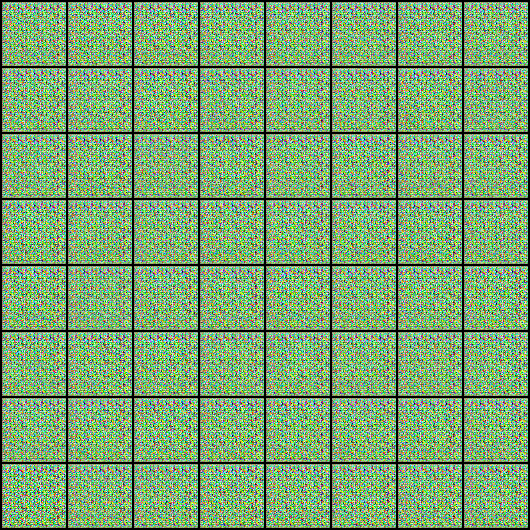

In [36]:
Image('./generated/generated-images-0001.png')

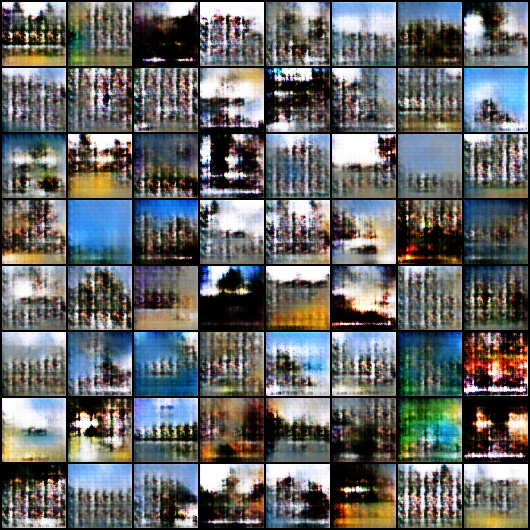

In [37]:
Image('./generated/generated-images-0100.png')

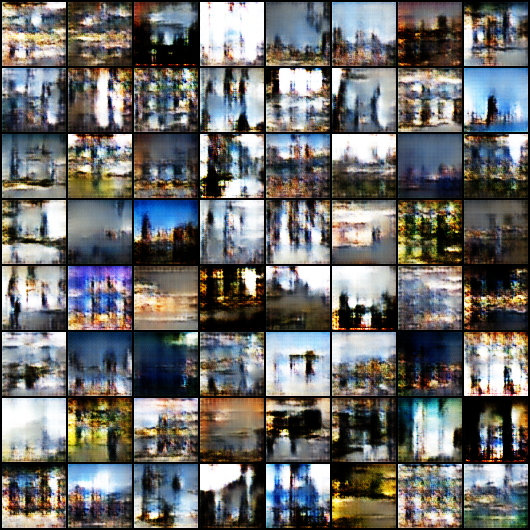

In [38]:
Image('./generated/generated-images-0200.png')

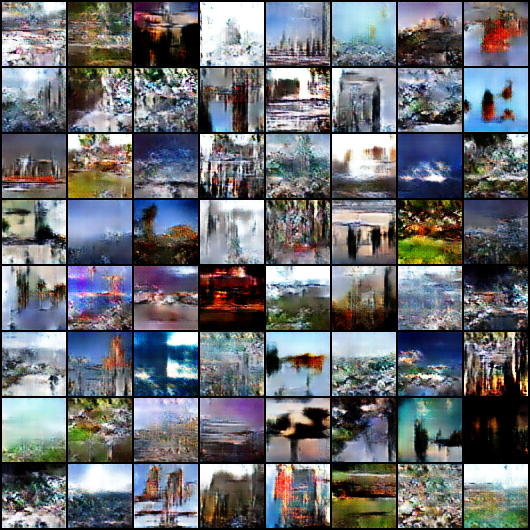

In [39]:
Image('./generated/generated-images-0300.png')

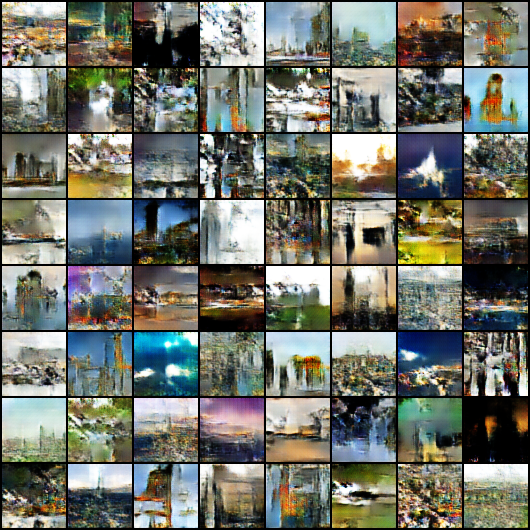

In [40]:
Image('./generated/generated-images-0400.png')

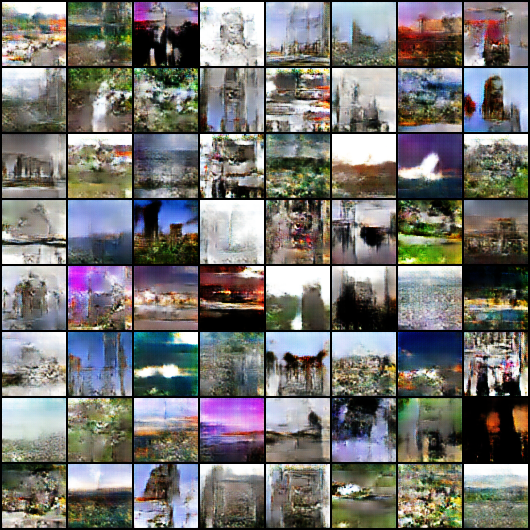

In [41]:
Image('./generated/generated-images-0450.png')

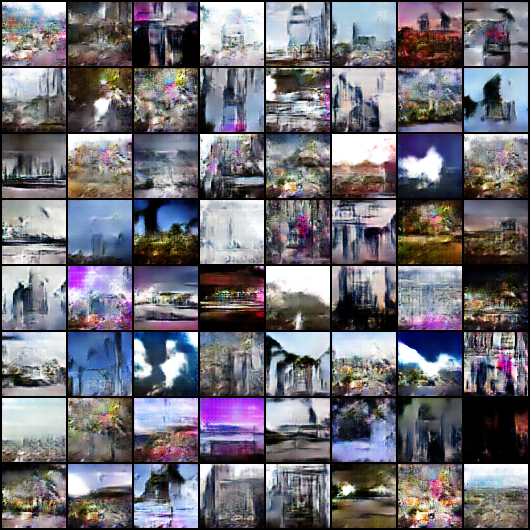

In [42]:
Image('./generated/generated-images-0500.png')

In [43]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

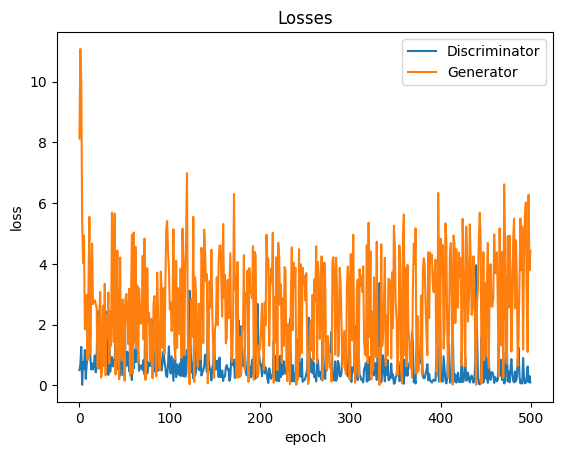

In [44]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

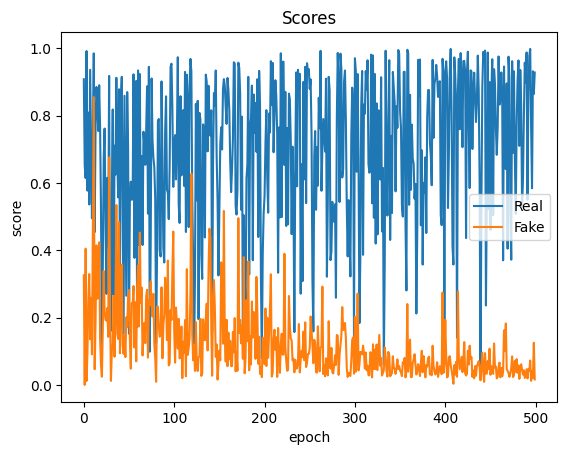

In [45]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');